# **SneakerGAN Tutorial**

This notebook demonstrates how to run NVIDIA's StyleGAN2 on Google Colab to generate Nike Sneakers. Make sure to specify a GPU runtime.
   
First need to clone it into our local working directory

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/
!git clone https://github.com/NVlabs/stylegan2

/content
Cloning into 'stylegan2'...
remote: Enumerating objects: 122, done.
remote: Total 122 (delta 0), reused 0 (delta 0), pack-reused 122
Receiving objects: 100% (122/122), 590.21 KiB | 1.55 MiB/s, done.
Resolving deltas: 100% (55/55), done.


Next we are going to select Tensorflow Version 1.15


In [ ]:
%tensorflow_version 1.x
import tensorflow as tf

TensorFlow is already loaded. Please restart the runtime to change versions.


Then we are going to download the pretrained NikeGAN from Google Drive

In [ ]:
%mkdir pretrained
%cd pretrained
#Nike Network
!gdown --id 1Rt2aXu74BOfMcdSFy44lhkGMS-Foxqmp
%cd /content/

/content/pretrained
Downloading...
From: https://drive.google.com/uc?id=1Rt2aXu74BOfMcdSFy44lhkGMS-Foxqmp
To: /content/pretrained/network-snapshot-011519.pkl
382MB [00:02, 176MB/s]
/content


Load the network 

In [ ]:
%cd /content/stylegan2/
# Download the model of choice
import argparse
import numpy as np
import PIL.Image
import dnnlib
import dnnlib.tflib as tflib
import re
import sys
from io import BytesIO
import IPython.display
import numpy as np
from math import ceil
from PIL import Image, ImageDraw
import imageio

import pretrained_networks

#Once you have trained a network you can replace this path with the path to your pkl
network_pkl = "/content/pretrained/network-snapshot-011519.pkl"

print('Loading networks from "%s"...' % network_pkl)
_G, _D, Gs = pretrained_networks.load_networks(network_pkl)
noise_vars = [var for name, var in Gs.components.synthesis.vars.items() if name.startswith('noise')]

/content/stylegan2


ModuleNotFoundError: ignored

 Hit Play To Load Useful Utility Functions

In [ ]:
# Useful utility functions...

# Generates a list of images, based on a list of latent vectors (Z), and a list (or a single constant) of truncation_psi's.
def generate_images_in_w_space(dlatents, truncation_psi):
    Gs_kwargs = dnnlib.EasyDict()
    Gs_kwargs.output_transform = dict(func=tflib.convert_images_to_uint8, nchw_to_nhwc=True)
    Gs_kwargs.randomize_noise = False
    Gs_kwargs.truncation_psi = truncation_psi
    dlatent_avg = Gs.get_var('dlatent_avg') # [component]

    imgs = []
    for row, dlatent in log_progress(enumerate(dlatents), name = "Generating images"):
        #row_dlatents = (dlatent[np.newaxis] - dlatent_avg) * np.reshape(truncation_psi, [-1, 1, 1]) + dlatent_avg
        dl = (dlatent-dlatent_avg)*truncation_psi   + dlatent_avg
        row_images = Gs.components.synthesis.run(dlatent,  **Gs_kwargs)
        imgs.append(PIL.Image.fromarray(row_images[0], 'RGB'))
    return imgs       

def generate_images(zs, truncation_psi):
    Gs_kwargs = dnnlib.EasyDict()
    Gs_kwargs.output_transform = dict(func=tflib.convert_images_to_uint8, nchw_to_nhwc=True)
    Gs_kwargs.randomize_noise = False
    if not isinstance(truncation_psi, list):
        truncation_psi = [truncation_psi] * len(zs)
        
    imgs = []
    for z_idx, z in log_progress(enumerate(zs), size = len(zs), name = "Generating images"):
        Gs_kwargs.truncation_psi = truncation_psi[z_idx]
        noise_rnd = np.random.RandomState(1) # fix noise
        tflib.set_vars({var: noise_rnd.randn(*var.shape.as_list()) for var in noise_vars}) # [height, width]
        images = Gs.run(z, None, **Gs_kwargs) # [minibatch, height, width, channel]
        imgs.append(PIL.Image.fromarray(images[0], 'RGB'))
    return imgs

def generate_zs_from_seeds(seeds):
    zs = []
    for seed_idx, seed in enumerate(seeds):
        rnd = np.random.RandomState(seed)
        z = rnd.randn(1, *Gs.input_shape[1:]) # [minibatch, component]
        zs.append(z)
    return zs

# Generates a list of images, based on a list of seed for latent vectors (Z), and a list (or a single constant) of truncation_psi's.
def generate_images_from_seeds(seeds, truncation_psi):
    return generate_images(generate_zs_from_seeds(seeds), truncation_psi)

def saveImgs(imgs, location):
  for idx, img in log_progress(enumerate(imgs), size = len(imgs), name="Saving images"):
    file = location+ str(idx) + ".png"
    img.save(file)

def imshow(a, format='png', jpeg_fallback=True):
  a = np.asarray(a, dtype=np.uint8)
  str_file = BytesIO()
  PIL.Image.fromarray(a).save(str_file, format)
  im_data = str_file.getvalue()
  try:
    disp = IPython.display.display(IPython.display.Image(im_data))
  except IOError:
    if jpeg_fallback and format != 'jpeg':
      print ('Warning: image was too large to display in format "{}"; '
             'trying jpeg instead.').format(format)
      return imshow(a, format='jpeg')
    else:
      raise
  return disp

def showarray(a, fmt='png'):
    a = np.uint8(a)
    f = StringIO()
    PIL.Image.fromarray(a).save(f, fmt)
    IPython.display.display(IPython.display.Image(data=f.getvalue()))

        
def clamp(x, minimum, maximum):
    return max(minimum, min(x, maximum))
    
def drawLatent(image,latents,x,y,x2,y2, color=(255,0,0,100)):
  buffer = PIL.Image.new('RGBA', image.size, (0,0,0,0))
   
  draw = ImageDraw.Draw(buffer)
  cy = (y+y2)/2
  draw.rectangle([x,y,x2,y2],fill=(255,255,255,180), outline=(0,0,0,180))
  for i in range(len(latents)):
    mx = x + (x2-x)*(float(i)/len(latents))
    h = (y2-y)*latents[i]*0.1
    h = clamp(h,cy-y2,y2-cy)
    draw.line((mx,cy,mx,cy+h),fill=color)
  return PIL.Image.alpha_composite(image,buffer)
             
  
def createImageGrid(images, scale=0.25, rows=1):
   w,h = images[0].size
   w = int(w*scale)
   h = int(h*scale)
   height = rows*h
   cols = ceil(len(images) / rows)
   width = cols*w
   canvas = PIL.Image.new('RGBA', (width,height), 'white')
   for i,img in enumerate(images):
     img = img.resize((w,h), PIL.Image.ANTIALIAS)
     canvas.paste(img, (w*(i % cols), h*(i // cols))) 
   return canvas

def convertZtoW(latent, truncation_psi=0.7, truncation_cutoff=9):
  dlatent = Gs.components.mapping.run(latent, None) # [seed, layer, component]
  dlatent_avg = Gs.get_var('dlatent_avg') # [component]
  for i in range(truncation_cutoff):
    dlatent[0][i] = (dlatent[0][i]-dlatent_avg)*truncation_psi + dlatent_avg
    
  return dlatent

def interpolate(zs, steps):
   out = []
   for i in range(len(zs)-1):
    for index in range(steps):
     fraction = index/float(steps) 
     out.append(zs[i+1]*fraction + zs[i]*(1-fraction))
   return out

# Taken from https://github.com/alexanderkuk/log-progress
def log_progress(sequence, every=1, size=None, name='Items'):
    from ipywidgets import IntProgress, HTML, VBox
    from IPython.display import display

    is_iterator = False
    if size is None:
        try:
            size = len(sequence)
        except TypeError:
            is_iterator = True
    if size is not None:
        if every is None:
            if size <= 200:
                every = 1
            else:
                every = int(size / 200)     # every 0.5%
    else:
        assert every is not None, 'sequence is iterator, set every'

    if is_iterator:
        progress = IntProgress(min=0, max=1, value=1)
        progress.bar_style = 'info'
    else:
        progress = IntProgress(min=0, max=size, value=0)
    label = HTML()
    box = VBox(children=[label, progress])
    display(box)

    index = 0
    try:
        for index, record in enumerate(sequence, 1):
            if index == 1 or index % every == 0:
                if is_iterator:
                    label.value = '{name}: {index} / ?'.format(
                        name=name,
                        index=index
                    )
                else:
                    progress.value = index
                    label.value = u'{name}: {index} / {size}'.format(
                        name=name,
                        index=index,
                        size=size
                    )
            yield record
    except:
        progress.bar_style = 'danger'
        raise
    else:
        progress.bar_style = 'success'
        progress.value = index
        label.value = "{name}: {index}".format(
            name=name,
            index=str(index or '?')
        )





Hit play to generated 16 images.  
The corresponding seeds will be printed below the grid of images in an array.   

**Change the threshold value to make more or less realistic sneakers.**

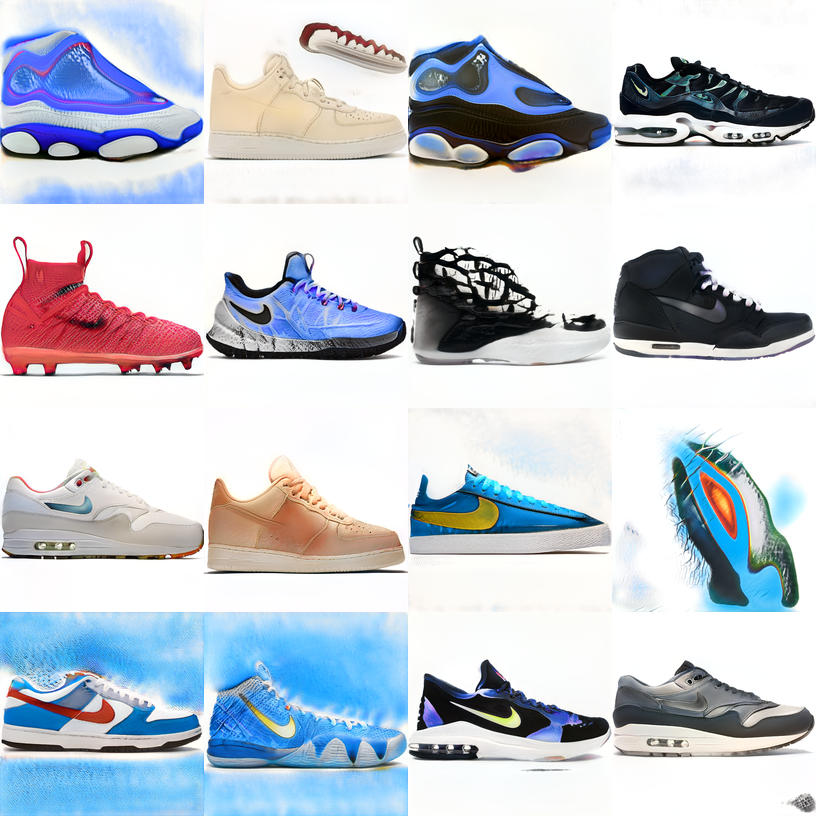

[  65365 8132026  250885 2893704 6129705 4621338 9389706 5158412 1737721
 2886960 2711948 7450125 3433410 2497212 5447352 4102898]


In [ ]:
# generate some random seeds
seeds = np.random.randint(10000000, size=16)
threshold = 1.5
# show the seeds
imshow(createImageGrid(generate_images_from_seeds(seeds, threshold), 0.2 , 4))
print(seeds)

Copy the any seeds from the array printed above and replace the values provided below.  Repeat the process until you have populated the 7 seeds you like and hit play.  You should see your selected sneakers in a row.  These will be your key-frames for your video. 

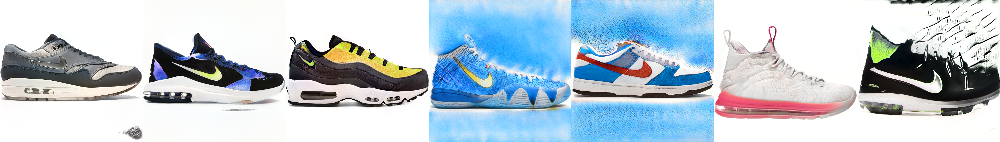

In [ ]:
imshow(createImageGrid(generate_images_from_seeds([4102898, 5447352, 2623241, 2497212, 3433410, 1298951, 4102898], threshold), 1 , 1))

Copy the list of seed from the above step and replace the provided list.  Hit play to generate a video.  You can add more seed if you like but you will need to adjust the number_of_steps to keep it within your desired length.  This is initially setup to produce a 15 second video from 7 seeds, with the start and end seed repeated to create a perfect loop. 

In [ ]:
zs = generate_zs_from_seeds([2897064, 2817565, 2623241, 2079182, 9498557, 1298951, 2897064])

number_of_steps = 75
imgs = generate_images(interpolate(zs,number_of_steps), threshold)

# Example of reading a generated set of images, and storing as MP4.
%mkdir out
movieName = 'out/mov.mp4'

with imageio.get_writer(movieName, fps=30, mode='I') as writer:
    for image in log_progress(list(imgs), name = "Creating animation"):
        writer.append_data(np.array(image))

In [ ]:
Download your video after it finishes rendering!  Enjoy!

# Training New Sneakers!
You will need to run the first three steps of this tutorial.  Ensure you have: 

1.   Cloned the StyleGAN2 
2.   Loaded Tensorflow
3.   Downloaded the pretrained model

 
You need a lot of images to train new sneakers.  Somewhere on the range of 1000-15000 images. We'll scrape them from http://thesneakerdatabase.com

# Downloading a Dataset

First lets create a folder to store the downloaded images

In [ ]:
%cd /content/
%mkdir dataset/
%cd /content/dataset/


/content
/content/dataset


Next lets download some Sneaker Images.  
Below you should see two variables named **brand** and **name** 

In [ ]:
%cd /content/dataset/
# importing the requests library 
import requests 
import shutil # to save it locally
import time
import json
import os
import urllib
import math

#Change the Brand Here!!!!!
brand = 'Jordan'
#Change the Brand Here!!!!!

#Change the name of the sneaker here!!!!
#remember space is %20 
name = '5'
#Change the name of the sneaker here!!!!

def download_image(image):
    response = requests.get(image, stream=True)
    filename = response.headers['X-Imgix-ID']
    f_ext = os.path.splitext(image)[-1].split('?')[0]
    f_name = ('{}{}').format(filename, f_ext)
    print(("Image downloaded {}").format(f_name))
    with open(f_name, 'wb') as f:
      f.write(response.content)
    del response


# api-endpoint 
url_half = "https://api.thesneakerdatabase.com/v1/sneakers?limit=100&page=";
url_second_half = "&brand={}&name={}".format(brand, name);
# magic query params that get us the image in the 
params = 'fit=fill&bg=FFFFFF&w=1024&h=1024&auto=format,compress&trim=color&q=100&dpr=1'

r = requests.get(url = url_half+str(0)+url_second_half)
data = r.json();

outputData = []
for x in range(math.ceil(data['count']/100)+1):
  url = ('{}{}{}').format(url_half, str(x), url_second_half)
  r = requests.get(url) 
  # extracting data in json format 
  data = r.json() 
  # printing the output 
  for item in data['results']:
    imgUrl = item['media']['imageUrl']
    if imgUrl != None:
      if "Placeholder" not in imgUrl:
        clip = imgUrl.split('?')
        imgUrl = clip[0]+'?'+params
        download_image(imgUrl)

Mount your Google Drive Folder so you can save the output to use again!

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Next we'll convert them into a dataset StyleGAN2 can understand. 
You need to give it a unique name, replace DATA_SET_NAME.  This will take a while

In [ ]:
%mkdir /content/drive/MyDrive/datasets

mkdir: cannot create directory ‘/content/drive/MyDrive/datasets’: File exists


In [ ]:
%cd /content/stylegan2/
!python dataset_tool.py create_from_images /content/drive/MyDrive/datasets/jordan5 /content/dataset

/content/stylegan2
Loading images from "/content/dataset"
Creating dataset "/content/drive/MyDrive/datasets/jordan5"
Added 44 images.


# Training

This command:
- Create the ***results*** folder and ***00001-pretrained*** folder 
- Then Copy the Pretrained network in the ***00001-pretrained*** folder

In [ ]:
%cd /content/stylegan2/
!mkdir results
!mkdir results/00001-pretrained
%cd results/00001-pretrained
%cp /content/pretrained/network-snapshot-011519.pkl .

/content/stylegan2
/content/stylegan2/results/00001-pretrained


# Now we are ready to train the network!  
# ***Warning this will take several hours!***

***Colab will timeout before the command completes***
It should give you some usable output in the results folder.  

Use your newly created network-snapshot-XXXXXX.pkl instead of the pretrained network to generate new images in the first half of this tutorial.  You will want to copy this file to your google drive to reuse again, as files are deleted from Colab unless you save them in drive.  Use that new path to load the network during the generation step

In [ ]:
%cd /content/stylegan2/
!python run_training.py --num-gpus=1 --data-dir=/content/drive/MyDrive/datasets/ --config=config-f --dataset=airforceone --mirror-augment=false --metrics=None 